## <center><font color="black">Bank Loan Qualification</font><center>

***Note*** : Please run the entire code once to avoid any problem in loading of visualization graphs.

A Bank want to understand its loan business. It wants to identify who would be the right target for the loans. The data contains both customers who have been given loans and those who haven’t yet received loans. The aim is to identify of the customers who haven’t been granted a loan which are more likely to repay the loan and provide loans to them.

The customers who have been granted loan, their data will be used for training the model and the customers which are not yet granted loan will be used for predicting if they will repay the loan or not considering the bank grants their loan request.

In [142]:
#Import libraries
import numpy as np
import pandas as pd
import itertools
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff
import warnings
warnings.filterwarnings("ignore")

## 1. Data

In [143]:
#borrower data
borrower = pd.read_csv("borrower_table.csv")
#loan data
loan = pd.read_csv("loan_table.csv")


In [144]:
borrower.head()

,loan_id,is_first_loan,fully_repaid_previous_loans,currently_repaying_other_loans,total_credit_card_limit,avg_percentage_credit_card_limit_used_last_year,saving_amount,checking_amount,is_employed,yearly_salary,age,dependent_number
0,289774,1,NaN,NaN,8000,0.49,3285,1073,0,0,47,3
1,482590,0,1.0,0.0,4500,1.03,636,5299,1,13500,33,1
2,135565,1,NaN,NaN,6900,0.82,2085,3422,1,24500,38,8
3,207797,0,1.0,0.0,1200,0.82,358,3388,0,0,24,1
4,828078,0,0.0,0.0,6900,0.80,2138,4282,1,18100,36,1


In [145]:
loan.head()

,loan_id,loan_purpose,date,loan_granted,loan_repaid
0,19454,investment,2012-03-15,0,NaN
1,496811,investment,2012-01-17,0,NaN
2,929493,other,2012-02-09,0,NaN
3,580653,other,2012-06-27,1,1.0
4,172419,business,2012-05-21,1,0.0


### 1.1 Data Overview

In [146]:
#data overview for borrower table
print("Rows: " , borrower.shape[0])
print("Columns: ", borrower.shape[1])
print("Features: ", borrower.columns.values)
print("\nMissing values : " , borrower.isnull().sum().values.sum())
print("\nUnique values:\n", borrower.nunique())

Rows:  101100
Columns:  12
Features:  ['loan_id' 'is_first_loan' 'fully_repaid_previous_loans'
 'currently_repaying_other_loans' 'total_credit_card_limit'
 'avg_percentage_credit_card_limit_used_last_year' 'saving_amount'
 'checking_amount' 'is_employed' 'yearly_salary' 'age' 'dependent_number']

Missing values :  116866

Unique values:
 loan_id                                            101100
is_first_loan                                           2
fully_repaid_previous_loans                             2
currently_repaying_other_loans                          2
total_credit_card_limit                               125
avg_percentage_credit_card_limit_used_last_year       110
saving_amount                                        6845
checking_amount                                      9653
is_employed                                             2
yearly_salary                                         834
age                                                    62
dependent_number      

In [147]:
#data overview for loan table
print("Rows: " , loan.shape[0])
print("Columns: ", loan.shape[1])
print("Features: ", loan.columns.values)
print("\nMissing values : " , loan.isnull().sum().values.sum())
print("\nUnique values:\n", loan.nunique())

Rows:  101100
Columns:  5
Features:  ['loan_id' 'loan_purpose' 'date' 'loan_granted' 'loan_repaid']

Missing values :  53446

Unique values:
 loan_id         101100
loan_purpose         5
date               260
loan_granted         2
loan_repaid          2
dtype: int64


## 2.Data Manipulation

In [148]:
#merging borrower and loan dataframe into one on loan_id as index
bank_df = borrower.merge(loan,on='loan_id')
bank_df.head()

,loan_id,is_first_loan,fully_repaid_previous_loans,currently_repaying_other_loans,total_credit_card_limit,avg_percentage_credit_card_limit_used_last_year,saving_amount,checking_amount,is_employed,yearly_salary,age,dependent_number,loan_purpose,date,loan_granted,loan_repaid
0,289774,1,NaN,NaN,8000,0.49,3285,1073,0,0,47,3,business,2012-01-31,0,NaN
1,482590,0,1.0,0.0,4500,1.03,636,5299,1,13500,33,1,investment,2012-11-02,0,NaN
2,135565,1,NaN,NaN,6900,0.82,2085,3422,1,24500,38,8,other,2012-07-16,1,1.0
3,207797,0,1.0,0.0,1200,0.82,358,3388,0,0,24,1,investment,2012-06-05,0,NaN
4,828078,0,0.0,0.0,6900,0.80,2138,4282,1,18100,36,1,emergency_funds,2012-11-28,0,NaN


In [149]:
#find number of not null values if it is a first loan for the borrower
first_loan = bank_df[bank_df['is_first_loan']==1][['fully_repaid_previous_loans','currently_repaying_other_loans']]
first_loan.notnull().sum()

fully_repaid_previous_loans       0
currently_repaying_other_loans    0
dtype: int64

In [150]:
# find number of null values if it is not a first loan for the borrower
not_first_loan = bank_df[bank_df['is_first_loan']==0][['fully_repaid_previous_loans','currently_repaying_other_loans']]
not_first_loan.isnull().sum()

fully_repaid_previous_loans       0
currently_repaying_other_loans    0
dtype: int64

In [151]:
#find number of null values in loan_repaid column if loan is granted to the borrower
granted = bank_df[bank_df['loan_granted']==1]['loan_repaid']
granted.isnull().sum()

0

In [152]:
#find number of not null values in loan_repaid column if loan is not granted to the borrower
not_granted = bank_df[bank_df['loan_granted']==0]['loan_repaid']
not_granted.notnull().sum()

0

From above it is clear that, if first_loan is 1 the values for column 'fully_repaid_previous_loans' and 'currently_repaying_other_loans' are null values whereas if first_loan is 0 there are no null values for these columns. Similarly, for borrowers who have been granted loan, the 'loan_repaid' column has no null values i.e it is either 0 or 1. Whereas for all borrowers who are not granted loan, the 'loan_repaid' is null.

We can replace the null values in 'currently_repaying_other_loans' with 0 because if this is the first loan for the customer then we can say he/she is currently not paying any other loans. Since, for customer with 'is_first_loan' value equals 1 the 'fully_repaid_previous_loans' is not applicable and manipulating it to either 0 or 1 will create ambiguity in the feature, I have decided to exclude that feature for further analysis.

In [153]:
#replace null values with 0 if this is a first loan by borrower
bank_df['currently_repaying_other_loans'] = bank_df['currently_repaying_other_loans'].fillna(value=0).astype(int)

#replace null values in avg_percentage_credit_card_limit_used_last_year to zero since its corresponding total_credit_card_limit is zero 
bank_df['avg_percentage_credit_card_limit_used_last_year'] = bank_df['avg_percentage_credit_card_limit_used_last_year'].fillna(value=0)

#convert date column to month column so that we can analyze loan repaid vs not repaid for every month
bank_df['date'] = pd.to_datetime(bank_df['date'])
bank_df['date'] = bank_df['date'].dt.strftime('%b')
bank_df = bank_df.rename(columns={'date':'month'})

#drop a column
bank_df = bank_df.drop(['fully_repaid_previous_loans'],axis=1)

#separate data for borrowers whose loan is granted from borrowers who have not been granted loan
loan_grant = bank_df[bank_df['loan_granted']==1].reset_index(drop=True)
loan_notgrant = bank_df[bank_df['loan_granted']==0].reset_index(drop=True)

#drop loan_granted column from both dataset 
loan_grant = loan_grant.drop('loan_granted',axis=1)
loan_notgrant = loan_notgrant.drop('loan_granted',axis=1)

loan_grant['loan_repaid'] = loan_grant['loan_repaid'].astype(int)

print("loan_grant : ", loan_grant.shape)
print("loan_not_grant :", loan_notgrant.shape)
print("null values in loan_grant dataframe : ", loan_grant.isnull().sum().values.sum())

id_col = ['loan_id']
target = ['loan_repaid']

#binary columns
bin_col = loan_grant.nunique()[loan_grant.nunique()==2].index.tolist()

#replacing 1 and 0 values to Yes/No types
loan_grant[bin_col] = loan_grant[bin_col].replace({1:"Yes",0:"No"})

#categorical columns
cat_col = loan_grant.nunique()[loan_grant.nunique()<13].index.tolist()
cat_col = [col for col in cat_col if col not in target]
#numerical columns
num_col = [col for col in loan_grant.columns if col not in id_col+target+cat_col]

#separating loan repaid and not repaid borrowers
repaid = loan_grant[loan_grant['loan_repaid']=='Yes']
not_repaid = loan_grant[loan_grant['loan_repaid']=='No']

loan_grant.head()

loan_grant :  (47654, 14)
loan_not_grant : (53446, 14)
null values in loan_grant dataframe :  0


,loan_id,is_first_loan,currently_repaying_other_loans,total_credit_card_limit,avg_percentage_credit_card_limit_used_last_year,saving_amount,checking_amount,is_employed,yearly_salary,age,dependent_number,loan_purpose,month,loan_repaid
0,135565,Yes,No,6900,0.82,2085,3422,Yes,24500,38,8,other,Jul,Yes
1,423171,Yes,No,6100,0.53,6163,5298,Yes,29500,24,1,other,Nov,Yes
2,200139,Yes,No,4000,0.57,602,2757,Yes,31700,36,8,business,Sep,No
3,991294,No,No,7000,0.52,2575,2917,Yes,58900,33,3,emergency_funds,Dec,Yes
4,875332,No,No,4300,0.83,722,892,Yes,5400,32,7,business,Jan,Yes


In [154]:
loan_notgrant['is_first_loan'].value_counts()

1    29158
0    24288
Name: is_first_loan, dtype: int64

## 3. Exploratory data analysis

### 3.1 Customer Loan Repaid Distribution 

In [155]:
#labels
labels = loan_grant['loan_repaid'].value_counts().keys().tolist()
#values
values = loan_grant['loan_repaid'].value_counts().values
values = values*100/sum(values).tolist()


trace = go.Bar(x = labels,
               y = values,
               marker=dict(color='orange',line=dict(color='white', width=1.5)),
               opacity = 0.8
              )

layout = go.Layout(dict(title = "Customer loan repaid distribution",
                        plot_bgcolor='rgb(243,243,243)',
                        paper_bgcolor='rgb(243,243,243)',
                        xaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                     title = "Loan repaid Status",
                                     zerolinewidth=1,ticklen=5,gridwidth=2),
                        yaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                     title = "Percent",
                                     zerolinewidth=1,ticklen=5,gridwidth=2)))

data = [trace]
figure = go.Figure(data = data, layout = layout)
py.iplot(figure)

**Insight :** The loan repaid class is not exactly balanced. Proportion of customers who repaid their loan is around 64 percent whereas customers who have't repaid loans constitute 36 percent.

### 3.2 Variables Distribution w.r.t  Customer Loan Repaid Status

In [156]:
#function to plot bar chart for categorical columns w.r.t repaid and not repaid customers
def bar_plot(column):
    
    trace1 = go.Bar(x=repaid[column].value_counts().keys().tolist(), 
                    y= repaid[column].value_counts().values.tolist(),
                    name="Loan repaid",
                    marker = dict(line = dict(width=1.2, color='black')),
                    opacity = 0.8)

    trace2 = go.Bar(x=not_repaid[column].value_counts().keys().tolist(), 
                    y= not_repaid[column].value_counts().values.tolist(),
                    name="Loan not repaid",
                    marker = dict(line = dict(width=1.2, color='black')),
                    opacity = 0.8)

    layout = go.Layout(dict(title=column+" distribution for different loan repaid status"),
                        plot_bgcolor='rgb(243,243,243)',
                        paper_bgcolor='rgb(243,243,243)',
                        xaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                     title = column,
                                     zerolinewidth=1,ticklen=5,gridwidth=2),
                        yaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                     title = "Count",
                                     zerolinewidth=1,ticklen=5,gridwidth=2)
                  )
    data = [trace1,trace2]
    figure = go.Figure(data = data, layout = layout)
    py.iplot(figure)
    

# function to plot histogram for numerical column types w.r.t repaid and not repaid customers
def hist_plot(column):
    trace1 = go.Histogram(x=repaid[column],
                          histnorm = "percent",
                          name = "Loan repaid customers",
                          marker = dict(line = dict(color="black", width=0.5)),
                          opacity = 0.9)
    
    trace2 = go.Histogram(x=not_repaid[column],
                          histnorm = "percent",
                          name = "Loan not repaid customers",
                          marker = dict(line = dict(color="black", width=0.5)),
                          opacity = 0.9)
    
    layout = go.Layout(dict(title= column+" distribution for different loan repaid status",
                            plot_bgcolor = "rgb(243,243,243)",
                            paper_bgcolor = "rgb(243,243,243)",
                            xaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                             title = column,
                                             zerolinewidth=1,
                                             ticklen=5,
                                             gridwidth=2),
                            yaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                             title = "percent",
                                             zerolinewidth=1,
                                             ticklen=5,
                                             gridwidth=2)))
    data = [trace1, trace2]
    fig = go.Figure(data = data, layout = layout)
    py.iplot(fig)
    
    
for col in num_col:
    hist_plot(col)
    
for col in cat_col:
    bar_plot(col)


**Insights from EDA** <br><br>
***Numerical Features:*** <br>
1. *total_credit_card_limit* : From the histogram we can see that some customers have zero credit card limit from which it is safe to assume that they dont have a credit card. Most of them have repaid their loans. However, for customers with non zero credit limit the distribution is approximately normal and most of the customers who have repaid their loans tend to have higher credit limit than defaulters. The loan repaid distribution has a higher mean than the loan not repaid distribution. Credit card limit can be a good factor for predicting the loan repayment from a customer. <br><br>
2. *avg_percentage_credit_card_limit_used_last_year* : For customers who have used their credit card, the histogram shows that the distribution is approximatley normal and the customers who have not repaid their loans tend to spend more using thier credit card than the customers who have repaid their loans. <br><br>
3. *saving_amount* : The distribution is approximately normal for both type of customers and the customers who have not repaid their loans have less saving amount than most of the customers who have repaid their loans. This shows customers with higher saving amount have repaid their loans. Saving amount can be one of the crucial features in predicting loan repayment.<br><br>
4. *checking_amount* :  The distribution is approximately normal for both type of customers and the customers who have not repaid their loans have less checking amount than most of the customers who have repaid their loans. This shows customers with higher checking amount have repaid their loans.<br><br>
5. *yearly_salary* : From the histogram we can see that the distribution of customers who repaid their loans have a higher average yearly salary than the customers who haven't repaid. There is very few percentage of customers who have a high yearly salary and not repaid their loans. Yearly salary can be an important factor for the banks to decide if a customer will repay the loan in due date.<br><br>
6. *Age* : The distribution looks normal for both type of customers and they have similar mean and standard deviation. Thus, the age factor does not seem significant for deciding whether the customer will repay his loan or not.<br><br><br>
***Categorical Features:***<br>
1. *is_first_loan* : From the bar graph, we can see that whether it is the first loan for the customers or not, it doesnot have any significant effect on the loan repaid outcome.<br><br>
2. *currently_repaying_other_loans* : For customers who are not repaying other loans, atleast two-third of them have repaid their loan whereas for customers who are repaying other loans majority of them have not repaid the loan granted by bank. This shows this as an important factor deciding the outcome for loan repayment.<br><br>
3. *is_employed* : More than two third of the customers who are employed have repaid their loans whereas around 4/5 of the customers who are unemployed have not repaid their loan. Unemployment can be a crucial factor in deciding the outcome of future loans.<br><br>
4. *dependent_number* : From the bar graph above, we can see that the ratio of customers who repaid loan to customers who have not repaid keeps on decreasing ass the number of dependents are increased. Thus, customers with more dependents are less likely to repay their loans than customers with few dependents.<br><br>
5. *loan_purpose* : Around two third of the customers who have taken loan for home, business or investment purposes have repaid their loans. Around 50 percent of customers who have taken loan for emergency funds or other purposes have not repaid their loan. These two groups of customers have not been very successful in comparison to other groups in repaying the loan.This can be an important feature for predicting the outcome.<br><br>
6. *month* : From the bar graph, we can see month does not play a crucial role in determining the outcome since the ratio of loan repaid to not repaid is almost same for all months.


### 3.3 Correlation Between Numerical Features

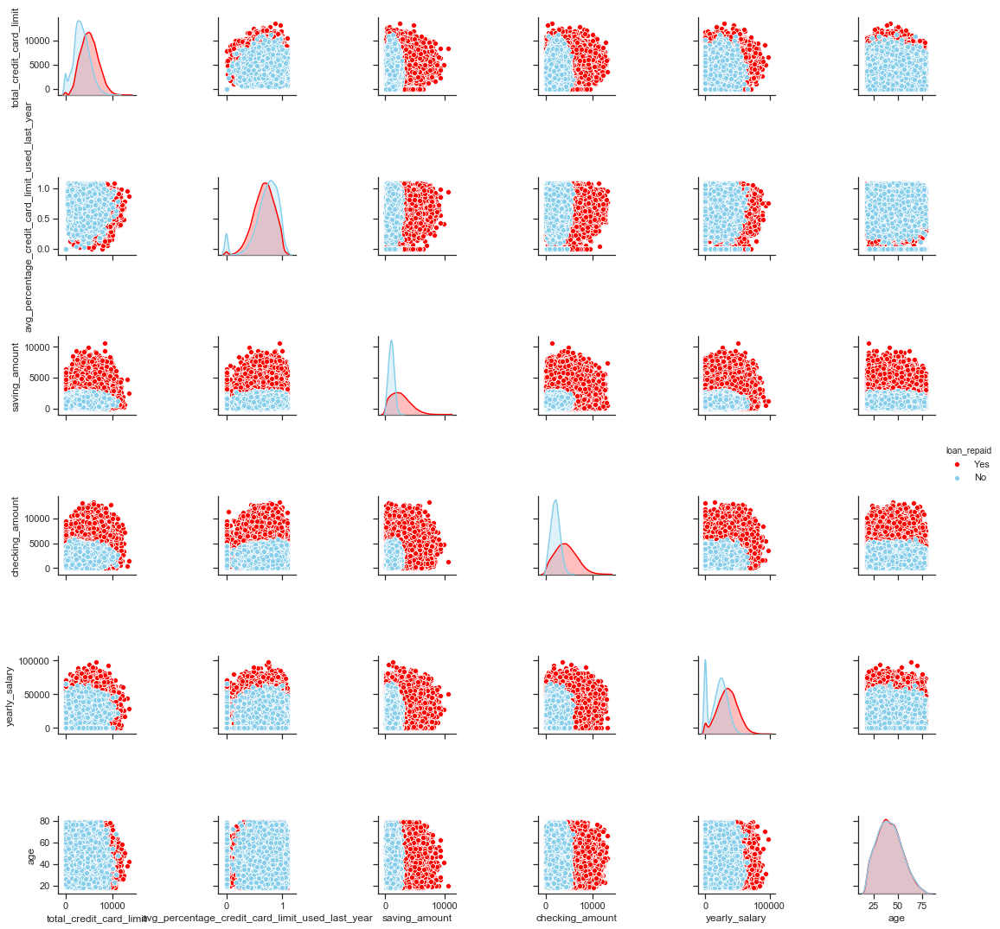

In [157]:
#scatter plot matrix for numerical features
import seaborn as sns
sns.set(style="ticks")
pal = ["red", "skyblue"]

sns.pairplot(loan_grant[num_col+target],hue="loan_repaid", palette=pal)   

In [158]:
#heatmap to plot correlation matrix
correlation = loan_grant.corr()

col_list = correlation.columns.tolist()

array = np.array(correlation)

trace = go.Heatmap(z=array,
                   y=col_list,
                   x=col_list,
                   colorscale='Viridis',
                   colorbar   = dict(title = "Pearson Correlation coefficient",
                                     titleside = "right"
                                    ) 
                  )
layout = go.Layout(dict(title="Correlation Matrix",
                        autosize=False,
                        height=700,
                        width=700,
                       margin = dict(r=0,l=200,
                                     t=100, b=200)))
data=[trace]
fig = go.Figure(data = data, layout=layout)
py.iplot(fig)

From the heatmap above we can see that the numerical features donot have any significant correlation between them. 

## 4.Data Preprocessing

### 4.1 Feature Engineering

In [159]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

#columns with binary values
bin_col = loan_grant.nunique()[loan_grant.nunique()==2].keys().tolist()
#columns with multiple categorical values
multi_col = [col for col in cat_col if col not in bin_col]

le = LabelEncoder()
for col in bin_col:
    loan_grant[col] = le.fit_transform(loan_grant[col])
    
#Convert multi categorical variable into dummy/indicator variables    
loan_grant = pd.get_dummies(data=loan_grant,columns=multi_col)    

#normalizing the columns with numerical values
ss = StandardScaler()
scaled = ss.fit_transform(loan_grant[num_col])
scaled = pd.DataFrame(scaled, columns = num_col)

#storing the original dataframe
loan_org = loan_grant.copy()
loan_grant = loan_grant.drop(num_col,axis=1)
loan_grant = loan_grant.merge(scaled,left_index=True,right_index=True,how="left")
loan_grant.head()

,loan_id,is_first_loan,currently_repaying_other_loans,is_employed,loan_repaid,dependent_number_0,dependent_number_1,dependent_number_2,dependent_number_3,dependent_number_4,...,month_May,month_Nov,month_Oct,month_Sep,total_credit_card_limit,avg_percentage_credit_card_limit_used_last_year,saving_amount,checking_amount,yearly_salary,age
0,135565,1,0,1,1,0,0,0,0,0,...,0,0,0,0,1.201025,0.665046,0.041940,-0.035804,-0.291409,-0.274989
1,423171,1,0,1,1,0,1,0,0,0,...,0,1,0,0,0.795983,-0.783149,2.772632,0.834687,0.015596,-1.367250
2,200139,1,0,1,0,0,0,0,0,0,...,0,0,0,1,-0.267251,-0.583398,-0.951099,-0.344373,0.150679,-0.431026
3,991294,0,0,1,1,0,0,0,1,0,...,0,0,0,0,1.251655,-0.833087,0.370052,-0.270131,1.820790,-0.665082
4,875332,0,0,1,1,0,0,0,0,0,...,0,0,0,0,-0.115360,0.714984,-0.870745,-1.209760,-1.464171,-0.743101


### 4.2 Feature Selection

The Chi-Squared test is a statistical hypothesis test that assumes (the null hypothesis) that the observed frequencies for a categorical variable match the expected frequencies for the categorical variable.

1. If Statistic >= Critical Value: significant result, reject null hypothesis (H0), dependent.
2. If Statistic < Critical Value: not significant result, fail to reject null hypothesis (H0), independent.

The SelectKBest class just scores the features using a scoring function.Here, we will use chi2 as the scoring function. There are total 35 predictors(loan_id is excluded) and we will use top 20 predictors for modelling.

In [160]:
from sklearn.feature_selection import chi2
from sklearn.feature_selection import SelectKBest
from sklearn.preprocessing import LabelEncoder

#loan_org is used since the values cannot be negative.
cols = [col for col in loan_org.columns if col not in target+id_col]
target=['loan_repaid']

    
chi_X = loan_org[cols]
chi_Y = loan_org[target]

#select top 20 features using chi2
select = SelectKBest(score_func=chi2,k=20)
fit = select.fit(chi_X,chi_Y)

#create a dataframe to store features and their chi2 scores
chi_df = pd.DataFrame({"Feature":cols,
                       "Score":fit.scores_,
                       "pvalue":fit.pvalues_})
chi_df.sort_values("Score",ascending=False,inplace=True)
chi_df = chi_df.reset_index(drop=True)
chi_df["Feature_Type"] = np.where(chi_df["Feature"].isin(num_col),"Numerical","Categorical" )

#visualization of chi2 scores for categorical features
trace1 = go.Scatter(x=chi_df[chi_df["Feature_Type"]=="Categorical"]["Feature"],
                    y=chi_df[chi_df["Feature_Type"]=="Categorical"]["Score"],
                    name = "Categorical",
                    mode = "lines+markers",
                    marker = dict(line=dict(width=0.5),
                                  color = "green"),
                    xaxis="x1", yaxis="y1"
                   )
#visualization of chi2 scores for numerical features
trace2 = go.Bar(x=chi_df[chi_df["Feature_Type"]=="Numerical"]["Feature"],
                    y=chi_df[chi_df["Feature_Type"]=="Numerical"]["Score"],
                    name = "Numerical",
                    marker = dict(color = "skyblue"),
                    xaxis = "x2", yaxis="y2"
                   )

layout = go.Layout(dict(title="Chi2 score for Categorical and Numerical Features",
                        plot_bgcolor= "rgb(243,243,243)",
                        paper_bgcolor="rgb(243,243,243)",
                         xaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                     tickfont = dict(size =10),
                                     domain=[0, 0.7],
                                     tickangle = 90,zerolinewidth=1,
                                     ticklen=5,gridwidth=2),
                        yaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                     title = "scores",
                                     zerolinewidth=1,ticklen=5,gridwidth=2),
                        margin = dict(b=200),
                        xaxis2=dict(domain=[0.8, 1],tickangle = 90,
                                    gridcolor = 'rgb(255, 255, 255)'),
                        yaxis2=dict(anchor='x2',gridcolor = 'rgb(255, 255, 255)')
                    ))
                   

data = [trace1,trace2]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

#taking top 20 features with high chi2 score
feature_col = chi_df.loc[0:19,'Feature']

## 5. Model Build

### 5.1 Logistic Regression

Logistic Regression measures the relationship between the dependent variable (our label, what we want to predict) and the one or more independent variables (our features), by estimating probabilities using it’s underlying logistic function. The reason for implementing this algorithm is because it is very efficient and does not require too many computational resources. Logistic Regression is also a good baseline that you can use to measure the performance of other more complex Algorithms. 

In [161]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix,accuracy_score,classification_report,f1_score
from sklearn.metrics import roc_curve,roc_auc_score,scorer
from sklearn.metrics import precision_recall_curve,auc
import statsmodels.api as sm
from sklearn.metrics import precision_score,recall_score


#split train and test data
train, test = train_test_split(loan_grant,test_size=0.25,random_state=4)
#select best 20 features
cols = feature_col
target=['loan_repaid']
train_X = train[cols]
train_Y = train[target]
test_X = test[cols]
test_Y = test[target]

#list of metrics for different models
metrics = []

#function to  fit and predict a given model along with metrics visualization
def loan_repay_predict(alg,train_X,train_Y,test_X,test_Y,cols,cf,model_name,metrics):
    #converting training and test target variable to 1d array
    train_Y = train_Y.values.ravel()
    test_Y = test_Y.values.ravel()
    
    alg.fit(train_X,train_Y)
    predictions = alg.predict(test_X)
    prob = alg.predict_proba(test_X)

    if cf=="coefficients":
        coefficients = pd.DataFrame(alg.coef_.ravel())
    elif cf == "features":
        coefficients = pd.DataFrame(alg.feature_importances_)
        
    columns = pd.DataFrame(cols)
    coef_sumry = columns.merge(coefficients,left_index=True,right_index=True,how="left")
    coef_sumry.columns = ["features", "coefficients"]
    coef_sumry.sort_values(["coefficients"],ascending=False,inplace=True)
    
    print(alg)
    print("\nClassification report :\n", classification_report(test_Y,predictions))
    
    acc_score = accuracy_score(test_Y,predictions)
    F1_score = f1_score(test_Y,predictions)
    print("\nAccuracy score : ", acc_score)
    print("\nF1 score : ", F1_score)
    
    #Area under ROC curve 
    roc_score = roc_auc_score(test_Y,predictions)
    print("\nROC score : ", roc_score)
    
    conf_matrix = confusion_matrix(test_Y,predictions)

    #precision recall curve
    precision, recall, thresholds = precision_recall_curve(test_Y, prob[:,1])
    
    # #Area under precision_recall curve
    prec_rec_score = auc(recall,precision)
    print("\nPrecision-Recall score : ", prec_rec_score, "\n")
    
    prec_score = precision_score(test_Y,predictions)
    recal_score = recall_score(test_Y,predictions)
    
    #list to store metrics
    scores = [model_name,acc_score,F1_score,prec_score,recal_score,alg]
    metrics.append(scores)
    
    #plot confusion matrix
    trace1 = go.Heatmap(z = conf_matrix,
                        x = ["Not repaid","Repaid"],
                        y = ["Not repaid","Repaid"],
                        showscale=False,
                        colorscale="Viridis",
                        name="Confusion matrix"
                       )
    
    #plot precision-recall curve
    trace2 = go.Scatter(x = recall,
                        y = precision,
                        name = "Precision_recall : " + str(prec_rec_score),
                        line = dict(color = ('rgb(22, 96, 167)'),width = 2)
                       )
  
    trace3 = go.Scatter(x=[0,1],
                        y=[0.5, 0.5],
                        line = dict(color = ('rgb(200, 96, 167)'),width = 2, dash='dot')
                        )
    
    #plot features and coefficients
    trace4 = go.Bar(x = coef_sumry['features'],
                    y = coef_sumry['coefficients'],
                    name = "coefficients",
                    marker = dict(color = coef_sumry["coefficients"],
                                  colorscale = "Jet",
                                  line = dict(width = .6,color = "black")
                                 )
                   )
    
    
    #subplots
    fig = tls.make_subplots(rows=2, cols=2, specs=[[{}, {}], [{'colspan': 2}, None]],
                            subplot_titles=('Confusion Matrix',
                                            'Precision Recall Curve',
                                            'Feature Importances'))
    fig.append_trace(trace1,1,1)
    fig.append_trace(trace2,1,2)
    fig.append_trace(trace3,1,2)
    fig.append_trace(trace4,2,1)
    
    fig['layout'].update(showlegend=False, title="Model performance" ,
                         autosize = False,height = 900,width = 800,
                         plot_bgcolor = 'rgba(240,240,240, 0.95)',
                         paper_bgcolor = 'rgba(240,240,240, 0.95)',
                         margin = dict(b = 195))
    
    fig["layout"]["xaxis2"].update(dict(title = "Recall"))
    fig["layout"]["yaxis2"].update(dict(title = "Precision"))
    
    py.iplot(fig)
    return scores

        
#Logistic regression model
logreg = LogisticRegression(C=1.0,solver='liblinear')
loan_repay_predict(logreg,train_X,train_Y,test_X,test_Y,cols,"coefficients","Logistic Regression",metrics)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='liblinear',
          tol=0.0001, verbose=0, warm_start=False)

Classification report :
               precision    recall  f1-score   support

           0       0.86      0.87      0.87      4243
           1       0.93      0.92      0.93      7671

   micro avg       0.90      0.90      0.90     11914
   macro avg       0.89      0.90      0.90     11914
weighted avg       0.90      0.90      0.90     11914


Accuracy score :  0.9037267080745341

F1 score :  0.9250963233853589

ROC score :  0.8958006336047197

Precision-Recall score :  0.9829208051690256 

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]
[ (2,1) x3,y3           -      ]



['Logistic Regression',
 0.9037267080745341,
 0.9250963233853589,
 0.926851609526302,
 0.9233476730543606,
 LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
           intercept_scaling=1, max_iter=100, multi_class='warn',
           n_jobs=None, penalty='l2', random_state=None, solver='liblinear',
           tol=0.0001, verbose=0, warm_start=False)]

### 5.2 Random Forest

Random forests are bagged decision tree models that split on a subset of features on each split.The reasons for implementing this algorithm are as follows:

1. Each decision tree has a high variance, but low bias. But because we average all the trees in random forest, we are averaging the variance as well so that we have a low bias and moderate variance model.
2. It is great with high dimensional data since we are working with subsets of data.
3. It is faster to train than decision trees because we are working only on a subset of features in this model, so we can easily work with hundreds of features. 

In [162]:
from sklearn.ensemble import RandomForestClassifier

cols = feature_col

rfc = RandomForestClassifier(n_estimators = 100,
                             max_depth = 8,
                             criterion = "entropy")
loan_repay_predict(rfc,train_X,train_Y,test_X,test_Y,cols,"features","Random Forest",metrics)


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='entropy',
            max_depth=8, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

Classification report :
               precision    recall  f1-score   support

           0       0.87      0.91      0.89      4243
           1       0.95      0.92      0.94      7671

   micro avg       0.92      0.92      0.92     11914
   macro avg       0.91      0.92      0.91     11914
weighted avg       0.92      0.92      0.92     11914


Accuracy score :  0.9181635051200269

F1 score :  0.9356308179837591

ROC score :  0.915911329626998

Precision-Recall score :  0.9872542866949048 

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]
[

['Random Forest',
 0.9181635051200269,
 0.9356308179837591,
 0.9478330658105939,
 0.9237387563551036,
 RandomForestClassifier(bootstrap=True, class_weight=None, criterion='entropy',
             max_depth=8, max_features='auto', max_leaf_nodes=None,
             min_impurity_decrease=0.0, min_impurity_split=None,
             min_samples_leaf=1, min_samples_split=2,
             min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
             oob_score=False, random_state=None, verbose=0,
             warm_start=False)]

### 5.3 Support Vector Machine

SVM is a supervised machine learning algorithm which can be used for classification or regression problems. It uses a technique called the kernel trick to transform the data and then based on these transformations it finds an optimal boundary between the possible outputs.Non-linear SVM means that the boundary that the algorithm calculates doesn't have to be a straight line. The benefit is that you can capture much more complex relationships between your datapoints without having to perform difficult transformations on your own. The downside is that the training time is much longer as it's much more computationally intensive.

In [163]:
from sklearn.svm import SVC

#function to  fit and predict a given model along with metrics visualization
def loan_repay_predict_SVN(alg,train_X,train_Y,test_X,test_Y,model_name,metrics):
    
    #converting training and test target variable to 1d array
    train_Y = train_Y.values.ravel()
    test_Y = test_Y.values.ravel()
    
    alg.fit(train_X,train_Y)
    predictions = alg.predict(test_X)
    prob = alg.predict_proba(test_X)
    
    print(alg)
    print("\nClassification report :\n", classification_report(test_Y,predictions))
    
    acc_score = accuracy_score(test_Y,predictions)
    F1_score = f1_score(test_Y,predictions)
    print("\nAccuracy score : ", acc_score)
    print("\nF1 score : ", F1_score)
    
    #Area under ROC curve 
    roc_score = roc_auc_score(test_Y,predictions)
    print("\nROC score : ", roc_score)
    
    conf_matrix = confusion_matrix(test_Y,predictions)

    #precision recall curve
    precision, recall, thresholds = precision_recall_curve(test_Y, prob[:,1])
    
    #Area under precision_recall curve
    prec_rec_score = auc(recall,precision)
    print("\nPrecision-Recall score : ", prec_rec_score, "\n")
    
    prec_score = precision_score(test_Y,predictions)
    recal_score = recall_score(test_Y,predictions)
    
    #list to store metrics
    scores = [model_name,acc_score,F1_score,prec_score,recal_score,alg]
    metrics.append(scores)
    
    #plot precision-recall curve
    trace1 = go.Scatter(x = recall,
                        y = precision,
                        name = "Precision_recall : " + str(prec_rec_score),
                        line = dict(color = ('rgb(22, 96, 167)'),width = 2)
                       )
  
    trace2 = go.Scatter(x=[0,1],
                        y=[0.5, 0.5],
                        line = dict(color = ('rgb(200, 96, 167)'),width = 2, dash='dot')
                       )
    
        
    #plot confusion matrix
    trace3 = go.Heatmap(z = conf_matrix,
                        x = ["Not repaid","Repaid"],
                        y = ["Not repaid","Repaid"],
                        showscale=False,
                        colorscale="Viridis",
                        name="Confusion matrix",
                        xaxis = "x2", yaxis="y2"
                       )
    
    layout = go.Layout(dict(title="Model performance" ,
                            autosize = False,height = 500,width = 800,
                            showlegend = False,
                            plot_bgcolor  = "rgb(243,243,243)",
                            paper_bgcolor = "rgb(243,243,243)",
                            xaxis = dict(title = "Recall",
                                         gridcolor = 'rgb(255, 255, 255)',
                                         domain=[0, 0.5],
                                         ticklen=5,gridwidth=2),
                            yaxis = dict(title = "Precision",
                                         gridcolor = 'rgb(255, 255, 255)',
                                         zerolinewidth=1,
                                         ticklen=5,gridwidth=2),
                            margin = dict(b=200),
                            xaxis2=dict(domain=[0.7, 1],tickangle = 90,
                                        gridcolor = 'rgb(255,255, 255)'),
                            yaxis2=dict(anchor='x2',gridcolor = 'rgb(255, 255, 255)')
                           )
                  )
    data = [trace1,trace2,trace3]
    fig = go.Figure(data=data,layout=layout)
    py.iplot(fig)
    
    
svm = SVC(C=1.0, kernel='rbf', degree=3, gamma='auto_deprecated', coef0=0.0, shrinking=True,
          probability=True, tol=0.001, cache_size=200, class_weight=None, verbose=False, max_iter=1000, 
          decision_function_shape='ovr', random_state=4)

loan_repay_predict_SVN(svm,train_X,train_Y,test_X,test_Y,"Support Vector Machine",metrics)

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='rbf', max_iter=1000, probability=True, random_state=4,
  shrinking=True, tol=0.001, verbose=False)

Classification report :
               precision    recall  f1-score   support

           0       0.92      0.34      0.49      4243
           1       0.73      0.98      0.84      7671

   micro avg       0.75      0.75      0.75     11914
   macro avg       0.82      0.66      0.66     11914
weighted avg       0.80      0.75      0.71     11914


Accuracy score :  0.7532314923619271

F1 score :  0.8369926813040586

ROC score :  0.660024272419613

Precision-Recall score :  0.9757283056749244 



## 5.4 Gradient Boosting Classifier

Gradient Boosting build trees one at a time, where each new tree helps to correct errors made by previously trained tree. With each tree added, the model becomes even more expressive. The reason for implementing this algorithm is that it is really useful if the dataset is complex and dificult to train with better accuracy i.e reduce bias. However, gradient boosting algorithm can be prone to overfitting given the sequential nature of correcting errors. 

In [164]:
from sklearn.ensemble import GradientBoostingClassifier

gbc = GradientBoostingClassifier(n_estimators=100, learning_rate = 0.5, max_features=2, max_depth = 2, random_state = 4)

loan_repay_predict(gbc,train_X,train_Y,test_X,test_Y,cols,"features","Gradient Boosting",metrics)    

GradientBoostingClassifier(criterion='friedman_mse', init=None,
              learning_rate=0.5, loss='deviance', max_depth=2,
              max_features=2, max_leaf_nodes=None,
              min_impurity_decrease=0.0, min_impurity_split=None,
              min_samples_leaf=1, min_samples_split=2,
              min_weight_fraction_leaf=0.0, n_estimators=100,
              n_iter_no_change=None, presort='auto', random_state=4,
              subsample=1.0, tol=0.0001, validation_fraction=0.1,
              verbose=0, warm_start=False)

Classification report :
               precision    recall  f1-score   support

           0       0.88      0.91      0.89      4243
           1       0.95      0.93      0.94      7671

   micro avg       0.92      0.92      0.92     11914
   macro avg       0.91      0.92      0.92     11914
weighted avg       0.92      0.92      0.92     11914


Accuracy score :  0.9228638576464664

F1 score :  0.9396546063431611

ROC score :  0.918876852633858

Preci

['Gradient Boosting',
 0.9228638576464664,
 0.9396546063431611,
 0.9466790156125959,
 0.932733672272194,
 GradientBoostingClassifier(criterion='friedman_mse', init=None,
               learning_rate=0.5, loss='deviance', max_depth=2,
               max_features=2, max_leaf_nodes=None,
               min_impurity_decrease=0.0, min_impurity_split=None,
               min_samples_leaf=1, min_samples_split=2,
               min_weight_fraction_leaf=0.0, n_estimators=100,
               n_iter_no_change=None, presort='auto', random_state=4,
               subsample=1.0, tol=0.0001, validation_fraction=0.1,
               verbose=0, warm_start=False)]

## 6. Model Evaluation

### 6.1 Model Performance Metrics

In [165]:
#creating a dataframe to store metric values for the algorithms implemented above
columns = ['Model','Accuracy','F1_score','Precision','Recall','Algorithm']
metrics_df = pd.DataFrame(columns=columns)

#we have already calculated the metric values for each algorithm. Now we will put it in a dataframe
for index,metric in enumerate(metrics):
    metrics_df.loc[index,columns] = metric
    
metrics_df

#function for bar plot of metric values for different algorithms
def bar_plot_metrics(metric,color):
    trace = go.Bar(y=metrics_df["Model"],
                   x=metrics_df[metric],
                   orientation = 'h',
                   name = metric,
                   marker = dict(line = dict(width =1),
                                  color = color))
    return trace

layout = go.Layout(dict(title="Model Performance",
                        plot_bgcolor="rgb(243,243,243)",
                        paper_bgcolor ="rgb(243,243,243)",
                        showlegend=False,
                        height = 600,
                        width =800,
                        margin = dict(l=250)))

trace1 = bar_plot_metrics("Accuracy","orange")
trace2 = bar_plot_metrics("Precision","green")
trace3= bar_plot_metrics("Recall", "skyblue")
trace4 = bar_plot_metrics("F1_score","grey")


data=[trace1,trace2,trace3,trace4]
fig = go.Figure(data=data,layout=layout)
py.iplot(fig)    

### 6.2 Model Selection


F1 Score might be a better measure to use if we need to seek a balance between Precision and Recall and there is an uneven class distribution (large number of Actual Negatives). But here we have larger number of positives(loan repaid) than negatives.

In this particular business problem, false positives are more expensive than false negatives. Providing loan to a customer who will fail to repay will result in more loss to the bank than not providing loan to a potential customer. Therefore, we will use precision score metric for selection of a model. Higher the precision score lower the false positives and hence more profit to the bank

In [166]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

#columns with binary values
bin_col = loan_notgrant.nunique()[loan_notgrant.nunique()==2].keys().tolist()
#columns with multiple categorical values
multi_col = [col for col in cat_col if col not in bin_col]

le = LabelEncoder()
for col in bin_col:
    loan_notgrant[col] = le.fit_transform(loan_notgrant[col])
    
#Convert multi categorical variable into dummy/indicator variables    
loan_notgrant = pd.get_dummies(data=loan_notgrant,columns=multi_col)    

#normalizing the columns with numerical values
ss = StandardScaler()
scaled = ss.fit_transform(loan_notgrant[num_col])
scaled = pd.DataFrame(scaled, columns = num_col)

#storing the original dataframe
loan_notgrant_org = loan_notgrant.copy()
loan_notgrant = loan_notgrant.drop(num_col,axis=1)
loan_notgrant = loan_notgrant.merge(scaled,left_index=True,right_index=True,how="left")
loan_notgrant.head()

,loan_id,is_first_loan,currently_repaying_other_loans,is_employed,loan_repaid,dependent_number_0,dependent_number_1,dependent_number_2,dependent_number_3,dependent_number_4,...,month_May,month_Nov,month_Oct,month_Sep,total_credit_card_limit,avg_percentage_credit_card_limit_used_last_year,saving_amount,checking_amount,yearly_salary,age
0,289774,1,0,0,NaN,0,0,0,1,0,...,0,0,0,0,1.941992,-0.580010,1.315690,-0.958935,-0.755980,0.431542
1,482590,0,0,1,NaN,0,1,0,0,0,...,0,1,0,0,0.345475,1.230983,-0.753953,1.271322,-0.010320,-0.659428
2,207797,0,0,0,NaN,0,1,0,0,0,...,0,0,0,0,-1.159812,0.526708,-0.971153,0.262798,-0.755980,-1.360766
3,828078,0,0,1,NaN,0,1,0,0,0,...,0,1,0,0,1.440230,0.459634,0.419548,0.734603,0.243756,-0.425649
4,568977,1,0,0,NaN,0,0,1,0,0,...,0,0,1,0,-1.433501,0.761466,-1.012561,-0.756808,-0.755980,0.665322


In [167]:
#selecting model with highest precision score
print("Highest Precision : ", metrics_df['Precision'].max())
model = metrics_df[metrics_df['Precision']==metrics_df['Precision'].max()]['Algorithm'].values[0]
print("\nModel selected : \n", model)
cols = feature_col
model.fit(loan_grant[cols],loan_grant[target])
loan_notgrant['loan_repaid'] = model.predict(loan_notgrant[cols])

#sort the dataset according to loan_id in ascending order
loan_notgrant = loan_notgrant.sort_values('loan_id').reset_index(drop=True)

Highest Precision :  0.9478330658105939

Model selected : 
 RandomForestClassifier(bootstrap=True, class_weight=None, criterion='entropy',
            max_depth=8, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)


## 7. Result

The result file will contain only two columns i.e the loan_id and loan_repay in order to make the file readable. Only those loan ids will be included in the file which were not granted loan by the bank. Loan repay equal 1 means the prediction is that the customer will repay the loan and 0 means he/she will not be able to repay the loan. This prediction will help the bank to target potential customers and maximize their profit.

In [168]:
output = bank_df[bank_df['loan_granted']==0].sort_values('loan_id').reset_index(drop=True)
output.head()

,loan_id,is_first_loan,currently_repaying_other_loans,total_credit_card_limit,avg_percentage_credit_card_limit_used_last_year,saving_amount,checking_amount,is_employed,yearly_salary,age,dependent_number,loan_purpose,month,loan_granted,loan_repaid
0,30,0,0,4900,0.60,1378,1414,0,0,43,8,home,Dec,0,NaN
1,34,1,0,7800,1.04,1053,1243,0,0,71,8,business,May,0,NaN
2,39,0,0,8200,0.69,654,5272,1,35700,44,0,emergency_funds,Mar,0,NaN
3,40,1,0,5000,0.84,2362,1308,1,9000,45,8,home,Feb,0,NaN
4,49,0,0,2600,0.67,850,2678,1,25300,49,1,home,Feb,0,NaN


In [169]:
output['loan_repay'] = loan_notgrant['loan_repaid']
output = output.drop('loan_repaid',axis=1)
#keeping only two columns loan_id and loan_repay
output = output[['loan_id','loan_repay']]
#writing the results to a csv file
output.to_csv('Bank_Loan_Repay.csv',index=False)